#### **Concept-Based Explanations via SAM**

Les auteurs proposent un nouveau cadre d’XAI, EAC (Explain Any Concept), qui utilise le Segment Anything Model (SAM) pour extraire des concepts interprétables par l’humain à partir d’une image, au lieu de se baser sur des pixels de bas niveau ou des superpixels. Ces concepts servent de base pour des explications fidèles et compréhensibles.

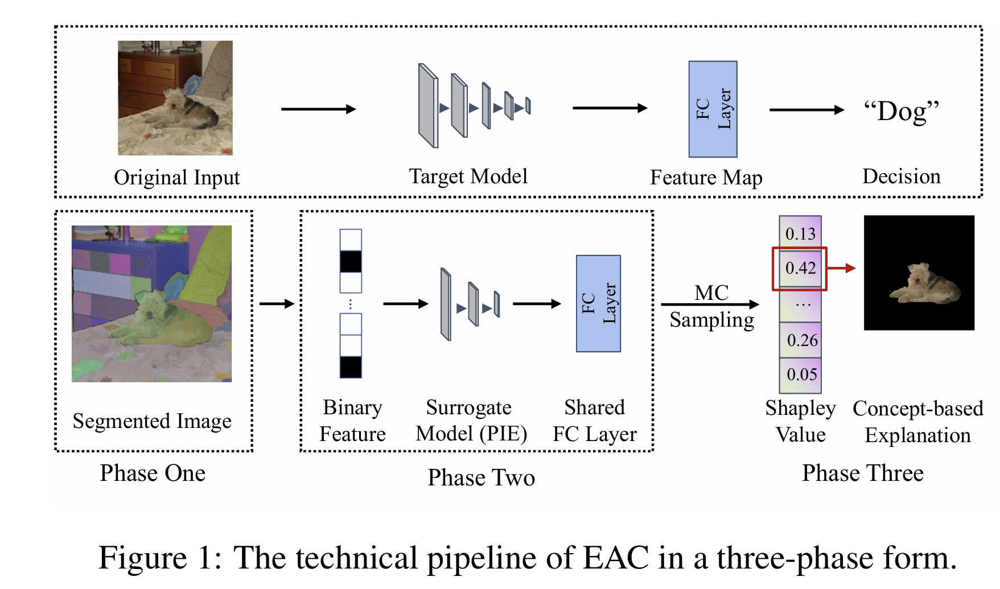

In [1]:
pip install torch torchvision segment-anything shapely scikit-learn matplotlib opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjit

In [2]:
# Standard Libraries
import sys
import random
import urllib.request
from itertools import combinations

# Scientific Libraries
import numpy as np
from scipy.interpolate import interp1d
from sklearn.linear_model import LogisticRegression
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
from torch.utils.data import Dataset
import numpy as np

# PyTorch and torchvision
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.models.feature_extraction import create_feature_extractor

# Image Processing
from PIL import Image
import cv2

# Segment Anything
from segment_anything import (
    sam_model_registry,
    SamAutomaticMaskGenerator,
    SamPredictor
)

# Add parent directory to system path
sys.path.append("..")

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Ajustements colab
with torch.no_grad():
  torch.cuda.empty_cache()

using_colab = True
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -O images/bus.png https://github.com/Candice8976/XAI_Explain_Any_Concept/raw/main/images/bus.png
    !wget -O images/train.png https://github.com/Candice8976/XAI_Explain_Any_Concept/raw/main/images/train.png
    !wget -O images/kitesurf.png https://github.com/Candice8976/XAI_Explain_Any_Concept/raw/main/images/kitesurf.png
    !wget -O images/zebra.png https://github.com/Candice8976/XAI_Explain_Any_Concept/raw/main/images/zebra.png

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.6.0+cu124
Torchvision version: 0.21.0+cu124
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-1zry9bw_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-1zry9bw_
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
--2025-06-17 20:49:48--  https://github.com/Candice8976/XAI_Explain_Any_Concept/raw/main/images/bus.png
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Candice8976/XAI_Explain_Any_Concept/main/images/bus.png [following]
--2025-06-17 20:49:49--  https://raw.githubusercontent.com/Candice8976/XAI_Explain_Any_Concept/main/images/bus.png
Resolving 

#### **Étape 1 : Découverte de Concepts Visuels avec SAM**

**Objectif :**  
Segmenter l’image d’entrée en régions visuellement cohérentes représentant des **concepts** (par exemple, « tête », « jambes », « feu arrière »).

**Détails :**  
- Appliquer **SAM** à l’image d’entrée `x` (sans indication ni supervision).  
- SAM produit un ensemble de **masques binaires** `{m₁, ..., mₙ}`.  
- Chaque masque définit un **concept visuel candidat** :  
  `cᵢ = mᵢ ⊙ x` (multiplication élément par élément).

**Sortie :**  
Une collection de concepts visuels non supervisés :  

#### **Sous-étape 1-2** : Charger l’image et la segmenter avec SAM

In [4]:
def load_sample() :
  """ Load images sample """
  bus = cv2.imread('images/bus.png')
  bus = cv2.cvtColor(bus, cv2.COLOR_BGR2RGB)

  train = cv2.imread('images/train.png')
  train = cv2.cvtColor(train, cv2.COLOR_BGR2RGB)

  kitesurf = cv2.imread('images/kitesurf.png')
  kitesurf = cv2.cvtColor(kitesurf, cv2.COLOR_BGR2RGB)

  zebra = cv2.imread('images/zebra.png')
  zebra = cv2.cvtColor(zebra, cv2.COLOR_BGR2RGB)

  images = [bus, train, kitesurf, zebra]
  return images


In [5]:
# === Segmentation with SAM ===

def load_SAM_maskGen(sam_checkpoint : str = "sam_vit_h_4b8939.pth", backbone : str = "vit_h"):
  """ load SAM model
  args :
    sam_checkpoint : (str) (default = sam_vit_h_4b8939.pth) : backbone checkpoints
    backbone : (str) (default = "vit_h") : backbone used
  return :
    mask_generator
  """
  sam = sam_model_registry[backbone](checkpoint=sam_checkpoint)
  sam.to(device=device)

  mask_generator = SamAutomaticMaskGenerator(sam)
  return mask_generator

def generate_masks(images : list, mask_generator:str = None)->list:
  """ Generate SAM masks
  args :
    images : (list) list of images to infer on
    maskk_generator : SAM mask generator if None -> SAM with vit_h backbone will be used
  return :
    list of masks of size images size
  """
  if not mask_generator :
    mask_generator = load_SAM_maskGen()
  masks = []
  for image in images:
    masks.append(mask_generator.generate(image))

  return masks


# Helper to verify anotations
def show_anns(anns)->None:
  """ Visualise annotations on top of images  """
  if len(anns) == 0:
      return None
  sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
  ax = plt.gca()
  ax.set_autoscale_on(False)

  img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
  img[:,:,3] = 0
  for ann in sorted_anns:
      m = ann['segmentation']
      color_mask = np.concatenate([np.random.random(3), [0.35]])
      img[m] = color_mask
  ax.imshow(img)


def visualise_im_annot(images, masks):
  """ Visualise annotations on top of the images """
  for image, mask in zip(images, masks):
    plt.figure(figsize=(20,20))
    plt.imshow(image)
    show_anns(mask)
    plt.axis('off')
    plt.show()

Image 0 → 74 concepts
Image 1 → 100 concepts
Image 2 → 31 concepts
Image 3 → 33 concepts


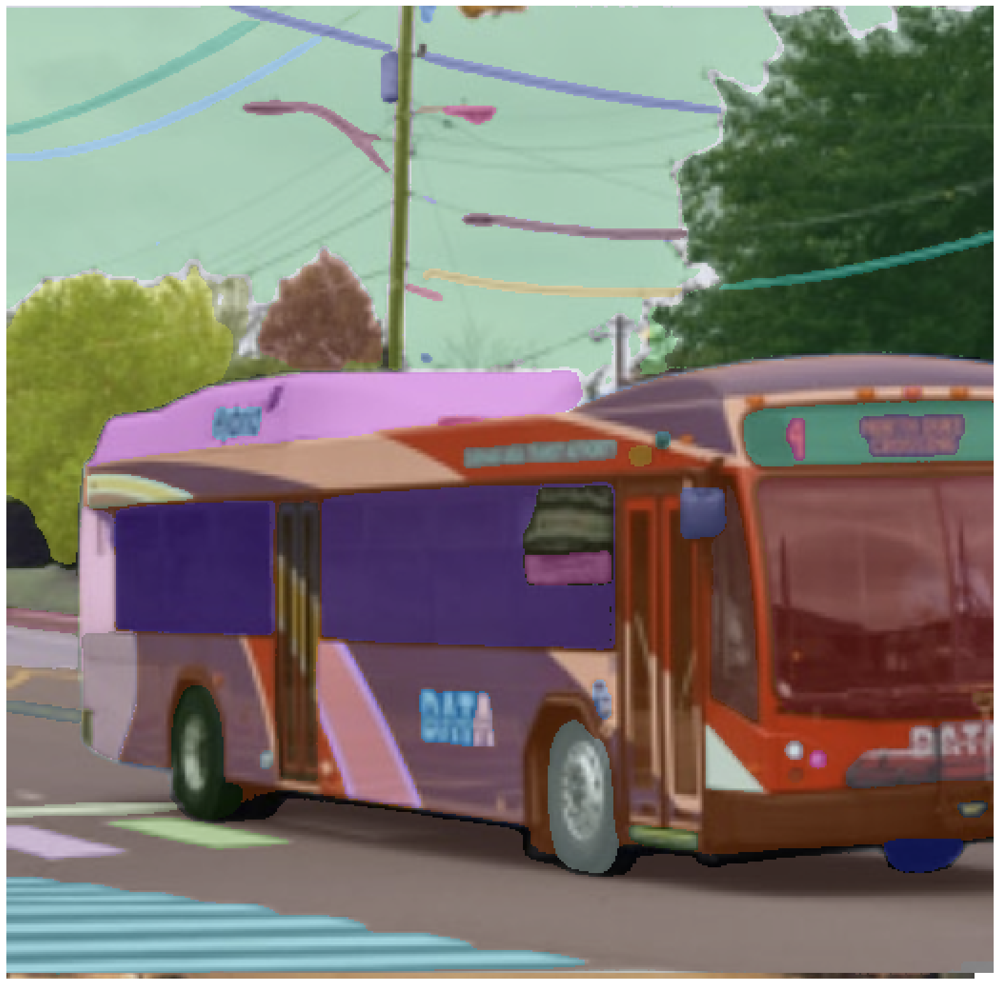

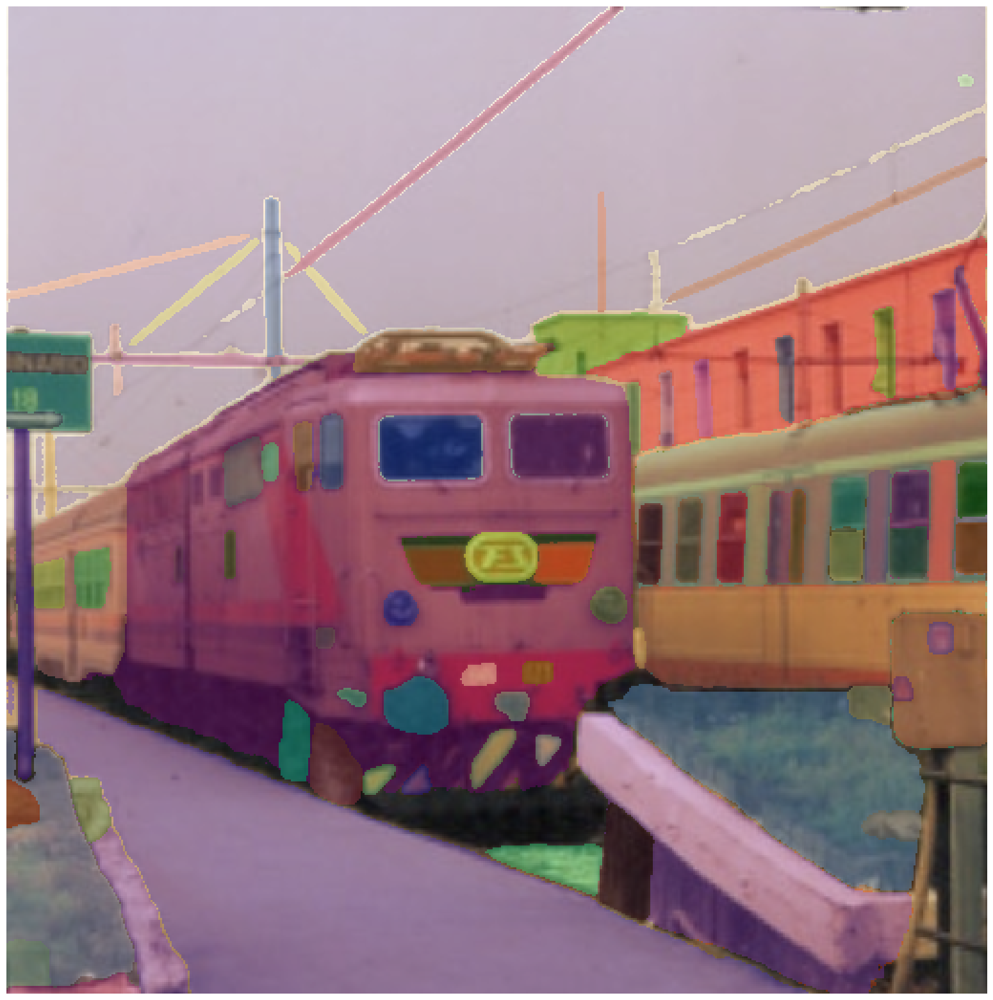

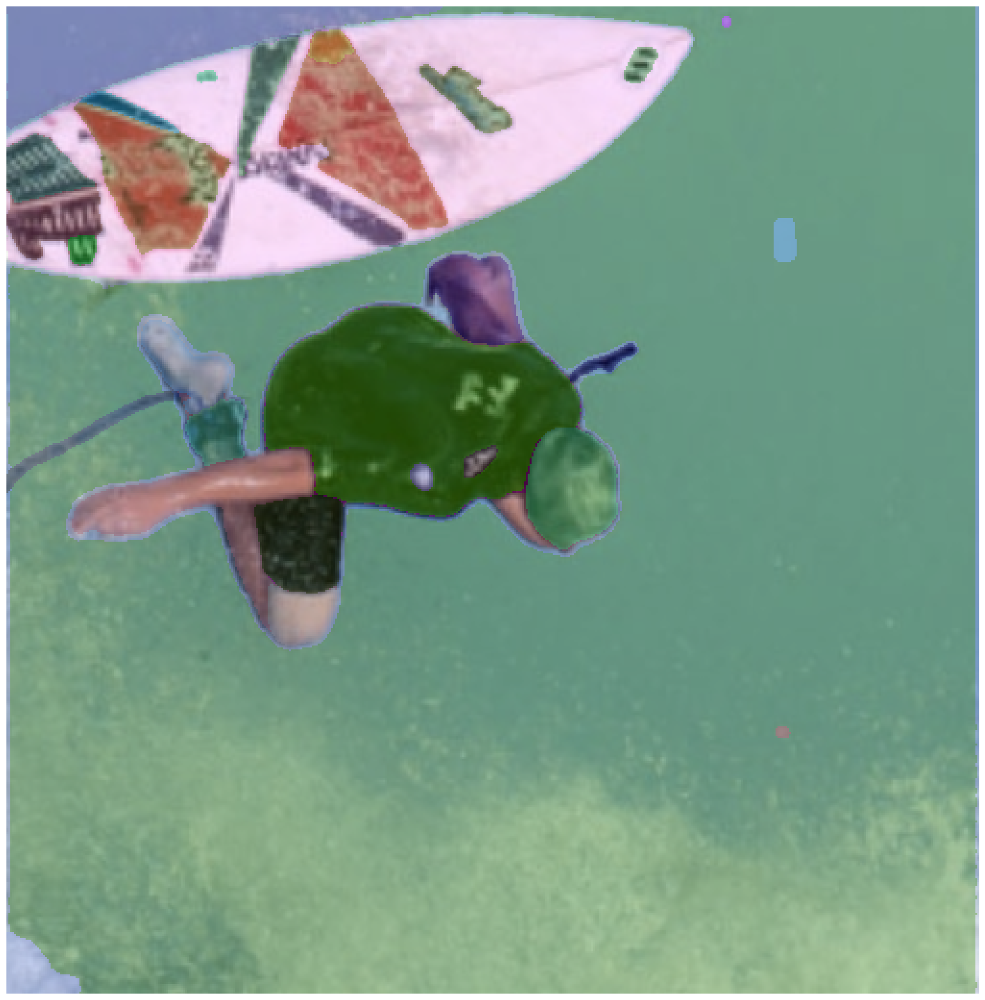

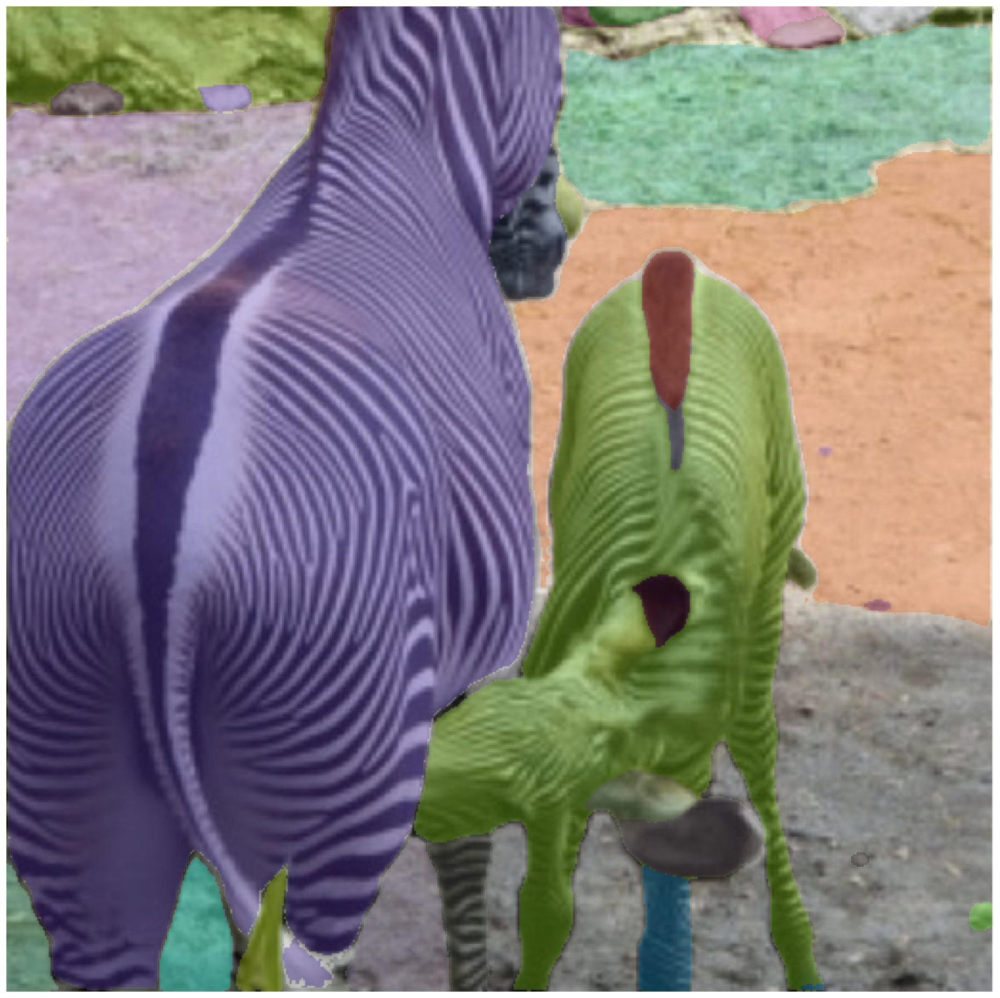

In [6]:
images = load_sample()
masks = generate_masks(images)

# let's see segmented concepts
for i, mask_list in enumerate(masks):
    print(f"Image {i} → {len(mask_list)} concepts")

# let's plot the predictions of SAM on top of the images
visualise_im_annot(images, masks)

#### **Étape 2 : Entraînement d’un Modèle de Substitut par Instance (PIE)**

**Objectif :**  
Entraîner un modèle de substitut `f′` (modèle plus simple) qui approxime le modèle original `f`, en utilisant **uniquement la présence ou l’absence des concepts découverts**.

**Détails :**  
- Pour chaque sous-ensemble `S ⊆ C(x)`, créer une image masquée :  
  `x_S = x ⊙ (⋁_{c ∈ S} mask(c))`  
- Entraîner `f′` pour approximer `f` :  
  `f′(S) ≈ f(x_S)`  
- Typiquement, `f′` est une **régression logistique** ou un **réseau neuronal léger**, entraîné sur des sous-ensembles aléatoires.

Cela évite d’interroger trop fréquemment `f` lors de l’estimation de l’importance et d'améliorer l'éfficiency.

**Sous-étape 3** : Charger le modèle cible : Resnet-50 pré-entraîné sur ImageNet

In [7]:
target_model = models.resnet50(weights='IMAGENET1K_V2')
target_model.eval()
target_model = target_model.to(device)
fc_layer = target_model.fc
#feature_extractor = torch.nn.Sequential(*list(model.children())[:-1])  # sans FC

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 197MB/s]


Récupérons les prédictions du Resnet-50

In [8]:
# ImageNet Normalisation (mean and std for RGB channels)
normalize = transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
)

In [9]:
def get_predicted_classes(images_np, model, device=device, target_size=(224, 224)):
    """
    Predicts classes for a list of numpy images (HWC), resized to target_size and
    Displays the predicted class names
    Returns :
     list of predicted indices.
    """
    # Load ImageNet class names (if not already cached)
    imagenet_classes_path = "imagenet_classes.txt"
    urllib.request.urlretrieve(
        "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
        imagenet_classes_path
    )
    with open(imagenet_classes_path) as f:
        class_names = [line.strip() for line in f.readlines()]

    preprocess = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(target_size),
        transforms.ToTensor(),  # convert to [0,1] and [C,H,W]
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

    tensors = []
    for i, img in enumerate(images_np):
        if isinstance(img, np.ndarray):
            if img.dtype != np.uint8:
                img = (img * 255).astype(np.uint8)  # Ensure correct format
            img_tensor = preprocess(img)
            tensors.append(img_tensor)
        else:
            raise ValueError("Chaque image doit être un tableau numpy (H,W,C)")

    batch = torch.stack(tensors).to(device)

    with torch.no_grad():
        logits = model(batch)
        predicted_indices = torch.argmax(logits, dim=1)

    # Print names
    for i, idx in enumerate(predicted_indices):
        print(f"Image {i} → classe prédite : {idx.item()} → {class_names[idx]}")

    return predicted_indices

In [10]:
# images_np = [img1, img2, img3, ...] (liste of numpy array HWC)
predicted_indices = get_predicted_classes(images_np=images, model=target_model)
print("List of predicted classes : ", predicted_indices.tolist())

Image 0 → classe prédite : 874 → trolleybus
Image 1 → classe prédite : 547 → electric locomotive
Image 2 → classe prédite : 701 → parachute
Image 3 → classe prédite : 340 → zebra
List of predicted classes :  [874, 547, 701, 340]


On remarque que le Resnet ne prédit pas correctement l’image 2, classifiant un parachute pour des images de kitesurf. Par la suite, on pourra s’attendre à ce que la planche de surf ne fasse pas partie des principaux concepts ayant conduit à la prédiction de Resnet.

#### **Sous-étape 4** : Mise en place du Modèle de Substitut

- L’article explique qu’un modèle de substitut distinct est entraîné pour chaque image d’entrée, c’est-à-dire un substitut par image.  
- Ce modèle de substitut approxime le comportement du modèle cible uniquement pour cette entrée spécifique, suivant l’approche Per-Input Equivalence (PIE).  
- Il utilise la couche entièrement connectée du modèle original (gardée gelée) et apprend un extracteur de caractéristiques léger pour mapper les concepts aux features.  
- L’entraînement consiste à masquer différents sous-ensembles de concepts et à comparer les probabilités de sortie du substitut pour la classe correcte avec celles du modèle cible sur ces images masquées.  
- Le modèle de substitut est optimisé pour coller au plus près aux prédictions du modèle cible, permettant des explications efficaces et précises pour cette entrée.

In [ ]:
''' class SurrogateModel(torch.nn.Module):
    def __init__(self, fc_layer, num_concepts, feature_dim=2048, lr=0.008):
        super().__init__()
        self.h = torch.nn.Sequential(
            torch.nn.Linear(num_concepts, feature_dim)
        )
        self.fc = fc_layer  # shared with ResNet

        # Freeze parameters
        for param in self.fc.parameters():
          param.requires_grad = False
        self.loss = torch.nn.BCELoss()

        self.optimizer = optim.SGD(self.h.parameters(), lr=lr, momentum=0.9)

    def forward(self, b_onehot):
        features = self.h(b_onehot)
        return self.fc(features) '''

' class SurrogateModel(torch.nn.Module):\n    def __init__(self, fc_layer, num_concepts, feature_dim=2048, lr=0.008):\n        super().__init__()\n        self.h = torch.nn.Sequential(\n            torch.nn.Linear(num_concepts, feature_dim)\n        )\n        self.fc = fc_layer  # shared with ResNet\n\n        # Freeze parameters\n        for param in self.fc.parameters():\n          param.requires_grad = False\n        self.loss = torch.nn.BCELoss()\n\n        self.optimizer = optim.SGD(self.h.parameters(), lr=lr, momentum=0.9)\n\n    def forward(self, b_onehot):\n        features = self.h(b_onehot)\n        return self.fc(features) '

In [11]:
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader

class SurrogateModel(torch.nn.Module):
    def __init__(self, fc_layer, num_concepts, feature_dim=2048, lr=0.008):
        super().__init__()
        self.h = torch.nn.Sequential(
            torch.nn.Linear(num_concepts, feature_dim)
        )
        self.fc = fc_layer  # Shared layer (frozen)

        for param in self.fc.parameters():
            param.requires_grad = False

        self.loss = torch.nn.BCELoss()
        self.optimizer = torch.optim.SGD(self.h.parameters(), lr=lr, momentum=0.9)

    def forward(self, b_onehot):
        features = self.h(b_onehot)
        return self.fc(features)

    def train_model(self, dataset, predicted_index, num_epochs=200, batch_size=64, device="cuda"):
        dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
        self.to(device)
        self.train()

        for epoch in range(num_epochs):
            total_loss = 0

            for x, y in dataloader:
                x = x.to(device)
                y = y.to(device)

                logits = self(x)
                probs = F.softmax(logits, dim=1)[:, predicted_index]

                loss = self.loss(probs, y)

                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()

            if epoch % 20 == 0 or epoch == num_epochs - 1:
                avg_loss = total_loss / len(dataloader)
                print(f"Epoch {epoch:03d} | Loss: {avg_loss:.4f}")


In [ ]:
''' surrogates = []
for mask in masks:
    num_concepts = len(mask)
    surrogates.append(SurrogateModel(fc_layer, num_concepts).to("cuda"))

for surrogate in surrogates:
  print(surrogate) '''

' surrogates = []\nfor mask in masks:\n    num_concepts = len(mask)\n    surrogates.append(SurrogateModel(fc_layer, num_concepts).to("cuda"))\n\nfor surrogate in surrogates:\n  print(surrogate) '

#### **Sous-étape 5** : Création des Données d’Entraînement pour le Modèle de Substitut

- Générer des images masquées en cachant différents sous-ensembles de concepts.  
- Obtenir les probabilités prédites par le modèle cible sur ces images masquées.  
- Utiliser ces paires pour entraîner le modèle de substitut à imiter le modèle cible.  

In [12]:
import torchvision.transforms as transforms

# === Create training coalitions ===
def mask_image_from_concepts(concepts : list, concept_mask: np.ndarray, image: np.ndarray):
    """
    Masks the image, keeping only the concepts enabled in concept_mask.
    Masking is done by multiplication, not direct zero replacement.

    Args:
        concepts (list of np.array): List of boolean masks (H x W) for each concpet.
        concept_mask (np.array): Binary concept selection vector (size = number of concepts).
        image (np.array): Image RGB  (H x W x 3), dtype uint8.

    Returns:
        masked_img_tensor (torch.Tensor): Masked, normalized image, shape [1, 3, H, W].
    """

    # Initialise combined mask float 2D (H x W) to 0
    mask_combined = np.zeros(image.shape[:2], dtype=float)

    for i, mask in enumerate(concepts):
        if concept_mask[i]:
            # Add region of the concept (binary mask converted to float)
            mask_combined += mask.astype(float)

    # Cip to not exceed 1 (in case of overlapp)
    mask_combined = np.clip(mask_combined, 0, 1)

    # Extend mask_combined across all 3 channels(H x W -> H x W x 3)
    mask_combined_3ch = np.repeat(mask_combined[:, :, np.newaxis], 3, axis=2)

    # Multiply pixel-wise (float multiplication)
    masked_img = image.astype(float) * mask_combined_3ch

    # Format correction to uint8
    masked_img = masked_img.astype(np.uint8)

    # Convert to a tensor, permutate (H, W, C) -> (C, H, W) and normaliser
    masked_img_tensor = torch.from_numpy(masked_img).permute(2, 0, 1).float() / 255.
    masked_img_tensor = normalize(masked_img_tensor)
    masked_img_tensor = masked_img_tensor.unsqueeze(0)  # batch dimension

    return masked_img_tensor


In [ ]:
''' datasets = {}  # to store dataset per image
num_samples = 2500

for img_idx, (image, mask, predicted_index) in enumerate(zip(images, masks, predicted_indices)):
    samples = []
    labels = []

    concepts = [mask["segmentation"] for mask in masks[img_idx]]  # if masks is a list of lists (per image)
    num_concepts = len(mask)

    for _ in range(num_samples):
        mask_bin = np.random.randint(0, 2, size=(num_concepts,))
        x_masked = mask_image_from_concepts(concepts, mask_bin, image)

        with torch.no_grad():
            out = target_model(x_masked.to("cuda"))
            probs = torch.nn.functional.softmax(out, dim=1)
            prob_target = probs[:, predicted_index]
            labels.append(prob_target.item())

        samples.append(torch.FloatTensor(mask_bin))

    samples_tensor = torch.stack(samples).to("cuda")
    labels_tensor = torch.tensor(labels).float().to("cuda")

    datasets[f"image_{img_idx}"] = (samples_tensor, labels_tensor) '''

' datasets = {}  # to store dataset per image\nnum_samples = 2500\n\nfor img_idx, (image, mask, predicted_index) in enumerate(zip(images, masks, predicted_indices)):\n    samples = []\n    labels = []\n\n    concepts = [mask["segmentation"] for mask in masks[img_idx]]  # if masks is a list of lists (per image)\n    num_concepts = len(mask)\n\n    for _ in range(num_samples):\n        mask_bin = np.random.randint(0, 2, size=(num_concepts,))\n        x_masked = mask_image_from_concepts(concepts, mask_bin, image)\n\n        with torch.no_grad():\n            out = target_model(x_masked.to("cuda"))\n            probs = torch.nn.functional.softmax(out, dim=1)\n            prob_target = probs[:, predicted_index]\n            labels.append(prob_target.item())\n\n        samples.append(torch.FloatTensor(mask_bin))\n\n    samples_tensor = torch.stack(samples).to("cuda")\n    labels_tensor = torch.tensor(labels).float().to("cuda")\n\n    datasets[f"image_{img_idx}"] = (samples_tensor, labels_ten

In [13]:
from torch.utils.data import Dataset

class ConceptDataset(Dataset):
    """
    Dataset personnalisé pour l'interprétabilité par concepts binaires.
    Pour une image donnée et ses concepts (masques), on génère un nombre d'exemples
    en appliquant des combinaisons aléatoires de concepts activés/désactivés.
    Chaque échantillon est une paire (masque_binaire, probabilité_modèle).
    """
    def __init__(self, image, masks, predicted_index, model, num_samples=2500, device="cuda"):
        """
        Paramètres :
        - image : image d'origine (Tensor)
        - masks : liste de dictionnaires contenant les segments de concepts
        - predicted_index : classe prédite par le modèle sur l'image d'origine
        - model : modèle cible utilisé pour évaluer les échantillons
        - num_samples : nombre de combinaisons à générer
        - device : "cuda" ou "cpu"
        """
        self.image = image
        self.masks = masks
        self.predicted_index = predicted_index
        self.model = model.to(device).eval()
        self.num_samples = num_samples
        self.device = device
        self.samples, self.labels = self._generate_samples()

    def _generate_samples(self):
        """
        Génère des combinaisons aléatoires de concepts masqués et prédit leur probabilité.
        Retourne :
        - samples_tensor : tenseur des masques binaires
        - labels_tensor : tenseur des probabilités associées
        """
        concepts = [m["segmentation"] for m in self.masks]  # Liste des masques binaires par concept
        num_concepts = len(concepts)
        samples = []
        labels = []

        for _ in range(self.num_samples):
            mask_bin = np.random.randint(0, 2, size=(num_concepts,))  # vecteur binaire aléatoire
            x_masked = mask_image_from_concepts(concepts, mask_bin, self.image)  # applique le masque

            with torch.no_grad():
                out = self.model(x_masked.to(self.device))
                probs = torch.nn.functional.softmax(out, dim=1)
                prob_target = probs[:, self.predicted_index].item()  # probabilité de la classe prédite

            samples.append(torch.FloatTensor(mask_bin))
            labels.append(prob_target)

        samples_tensor = torch.stack(samples)
        labels_tensor = torch.tensor(labels).float()

        return samples_tensor, labels_tensor

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        return self.samples[idx], self.labels[idx]

In [14]:
surrogates = []
datasets = {}

for img_idx in range(len(images)):
    print(f"-- Image n°{img_idx} --")

    dataset = ConceptDataset(
        image=images[img_idx],
        masks=masks[img_idx],
        predicted_index=predicted_indices[img_idx],
        model=target_model,
        num_samples=2500,
        device="cuda"
    )

    num_concepts = len(masks[img_idx])
    surrogate = SurrogateModel(fc_layer, num_concepts)
    surrogate.train_model(dataset, predicted_index=predicted_indices[img_idx], num_epochs=200)

    surrogates.append(surrogate)
    datasets[img_idx] = dataset  # Stocker le Dataset entier

-- Image n°0 --
Epoch 000 | Loss: 0.0931
Epoch 020 | Loss: 0.0754
Epoch 040 | Loss: 0.0749
Epoch 060 | Loss: 0.0748
Epoch 080 | Loss: 0.0741
Epoch 100 | Loss: 0.0744
Epoch 120 | Loss: 0.0740
Epoch 140 | Loss: 0.0750
Epoch 160 | Loss: 0.0739
Epoch 180 | Loss: 0.0746
Epoch 199 | Loss: 0.0746
-- Image n°1 --
Epoch 000 | Loss: 0.0543
Epoch 020 | Loss: 0.0453
Epoch 040 | Loss: 0.0445
Epoch 060 | Loss: 0.0448
Epoch 080 | Loss: 0.0445
Epoch 100 | Loss: 0.0447
Epoch 120 | Loss: 0.0443
Epoch 140 | Loss: 0.0444
Epoch 160 | Loss: 0.0450
Epoch 180 | Loss: 0.0441
Epoch 199 | Loss: 0.0442
-- Image n°2 --
Epoch 000 | Loss: 0.0327
Epoch 020 | Loss: 0.0256
Epoch 040 | Loss: 0.0256
Epoch 060 | Loss: 0.0250
Epoch 080 | Loss: 0.0250
Epoch 100 | Loss: 0.0250
Epoch 120 | Loss: 0.0252
Epoch 140 | Loss: 0.0251
Epoch 160 | Loss: 0.0248
Epoch 180 | Loss: 0.0249
Epoch 199 | Loss: 0.0250
-- Image n°3 --
Epoch 000 | Loss: 0.0921
Epoch 020 | Loss: 0.0643
Epoch 040 | Loss: 0.0635
Epoch 060 | Loss: 0.0635
Epoch 080 |

In [ ]:
''' datasets = {}
for img_idx, (image, mask, pred_idx) in enumerate(zip(images, masks, predicted_indices)):
    dataset = ConceptDataset(image, mask, pred_idx, target_model, num_samples=2500, device="cuda")
    datasets[f"image_{img_idx}"] = dataset
 '''

' datasets = {}\nfor img_idx, (image, mask, pred_idx) in enumerate(zip(images, masks, predicted_indices)):\n    dataset = ConceptDataset(image, mask, pred_idx, target_model, num_samples=2500, device="cuda")\n    datasets[f"image_{img_idx}"] = dataset\n '

In [16]:
print(f"Nombre d’images dans datasets: {len(datasets)}")

# Affichage d’un exemple
for key, dataset in datasets.items():
    print(f"\nImage index: {key}")
    print(f"Nombre d’échantillons : {len(dataset)}")

    x, y = dataset[0]
    print(f"Exemple sample[0] : {x}")
    print(f"Shape sample[0] : {x.shape}")
    print(f"Exemple label[0] : {y}")
    print(f"Type label[0] : {type(y)}")
    break  # pour ne pas afficher tout


Nombre d’images dans datasets: 4

Image index: 0
Nombre d’échantillons : 2500
Exemple sample[0] : tensor([1., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0.,
        1., 1., 1., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1., 1., 1., 0.,
        0., 1., 0., 0., 1., 0., 1., 0., 1., 0., 0., 1., 0., 1., 0., 0., 0., 0.,
        1., 0., 1., 0., 0., 1., 0., 1., 1., 1., 0., 1., 0., 1., 1., 1., 1., 1.,
        0., 0.])
Shape sample[0] : torch.Size([74])
Exemple label[0] : 0.023463523015379906
Type label[0] : <class 'torch.Tensor'>


**Sous étape 6 : Entrainer le modèle simplifié**

In [17]:
''' num_epochs = 200

for img_idx, surrogate in enumerate(surrogates):
    print(f"\n=== Entraînement surrogate pour image {img_idx} ===")

    samples_tensor, labels_tensor = datasets[f"image_{img_idx}"]

    for epoch in range(num_epochs):
        surrogate.train()

        # Forward pass : predict probability of target class
        pred = torch.nn.functional.softmax(surrogate(samples_tensor), dim=1)[:, predicted_indices[img_idx]]

        # Compute BCE Loss between prediction and ground truth
        loss = surrogate.loss(pred, labels_tensor)

        # Backpropagation
        surrogate.optimizer.zero_grad()
        loss.backward()
        surrogate.optimizer.step()

        if epoch % 20 == 0 or epoch == num_epochs - 1:
            print(f"Epoch {epoch:03d} | Loss: {loss.item():.4f}")
 '''

' num_epochs = 200\n\nfor img_idx, surrogate in enumerate(surrogates):\n    print(f"\n=== Entraînement surrogate pour image {img_idx} ===")\n\n    samples_tensor, labels_tensor = datasets[f"image_{img_idx}"]\n\n    for epoch in range(num_epochs):\n        surrogate.train()\n\n        # Forward pass : predict probability of target class\n        pred = torch.nn.functional.softmax(surrogate(samples_tensor), dim=1)[:, predicted_indices[img_idx]]\n\n        # Compute BCE Loss between prediction and ground truth\n        loss = surrogate.loss(pred, labels_tensor)\n\n        # Backpropagation\n        surrogate.optimizer.zero_grad()\n        loss.backward()\n        surrogate.optimizer.step()\n\n        if epoch % 20 == 0 or epoch == num_epochs - 1:\n            print(f"Epoch {epoch:03d} | Loss: {loss.item():.4f}")\n '

**Phase 3 : Explication Basée sur les Concepts**

**Objectif :**  
Quantifier la contribution de chaque concept `cᵢ` à la prédiction en utilisant les **valeurs de Shapley**, garantissant une attribution équitable.

**Détails :**  
- La **valeur de Shapley** de `cᵢ` est :  
  `φ_{cᵢ} = E_{S ⊆ C \ {cᵢ}} [f′(S ∪ {cᵢ}) - f′(S)]`  
- Estimée via un **échantillonnage Monte Carlo** :  
  `φ_{cᵢ} ≈ \frac{1}{K} \sum_{k=1}^K [f′(S_k ∪ {cᵢ}) - f′(S_k)]`

**Sortie :**  
Un **score d’importance φ_{cᵢ}** pour chaque concept visuel.

Les auteurs ont pu générer **K = 50 000** coalitions pour chaque concept de chaque image.  
Malheureusement, en raison de limitations techniques, nous avons pas pu en générer 20 000 par concept et par image.

In [ ]:
''' K = 20000
all_shapley_values = []

for img_idx, surrogate in enumerate(surrogates):
    print(f"\n=== Approximation Shapley pour image {img_idx} ===")
    num_concepts = surrogate.h[0].in_features  #number of concepts = input size
    shapley_values = torch.zeros(num_concepts).to("cuda")

    for i in range(num_concepts):
        print(f"=== Concept numéro {i} ===")
        for _ in range(K):
            S = torch.randint(0, 2, (num_concepts,), dtype=torch.float32).to("cuda")
            S[i] = 0
            S_with_ci = S.clone()
            S_with_ci[i] = 1

            pred_with_ci = surrogate(S_with_ci.unsqueeze(0))  # u(S ∪ {i})
            pred_without_ci = surrogate(S.unsqueeze(0))       # u(S)

            # Contribution to the probabiilty of the target class
            contrib = pred_with_ci[0][predicted_indices[img_idx]] - pred_without_ci[0][predicted_indices[img_idx]]
            shapley_values[i] += contrib

        shapley_values[i] /= K

    all_shapley_values.append(shapley_values) '''

In [18]:
def approximate_shapley_values(surrogates, predicted_indices, K=20000, device="cuda"):
    """
    Approxime les valeurs de Shapley pour chaque concept sur chaque image.

    Args:
        surrogates (list): Liste des modèles SurrogateModel entraînés.
        predicted_indices (list): Indices des classes prédites par image.
        K (int): Nombre d'échantillons Monte Carlo pour l'approximation.
        device (str): 'cuda' ou 'cpu'.

    Returns:
        list[Tensor]: Liste de tenseurs Shapley, un par image.
    """
    all_shapley_values = []

    for img_idx, surrogate in enumerate(surrogates):
        print(f"\n=== Approximation Shapley pour image {img_idx} ===")
        num_concepts = surrogate.h[0].in_features
        shapley_values = torch.zeros(num_concepts).to(device)

        for i in range(num_concepts):
            print(f"=== Concept numéro {i} ===")

            for _ in range(K):
                S = torch.randint(0, 2, (num_concepts,), dtype=torch.float32).to(device)
                S[i] = 0
                S_with_ci = S.clone()
                S_with_ci[i] = 1

                pred_with_ci = surrogate(S_with_ci.unsqueeze(0))
                pred_without_ci = surrogate(S.unsqueeze(0))

                contrib = pred_with_ci[0][predicted_indices[img_idx]] - pred_without_ci[0][predicted_indices[img_idx]]
                shapley_values[i] += contrib

            shapley_values[i] /= K

        all_shapley_values.append(shapley_values)

    return all_shapley_values

In [19]:
all_shapley_values = approximate_shapley_values(
    surrogates=surrogates,
    predicted_indices=predicted_indices,
    K=20000,
    device="cuda"
)


=== Approximation Shapley pour image 0 ===
=== Concept numéro 0 ===
=== Concept numéro 1 ===
=== Concept numéro 2 ===
=== Concept numéro 3 ===
=== Concept numéro 4 ===
=== Concept numéro 5 ===
=== Concept numéro 6 ===
=== Concept numéro 7 ===
=== Concept numéro 8 ===
=== Concept numéro 9 ===
=== Concept numéro 10 ===
=== Concept numéro 11 ===
=== Concept numéro 12 ===
=== Concept numéro 13 ===
=== Concept numéro 14 ===
=== Concept numéro 15 ===
=== Concept numéro 16 ===
=== Concept numéro 17 ===
=== Concept numéro 18 ===
=== Concept numéro 19 ===
=== Concept numéro 20 ===
=== Concept numéro 21 ===
=== Concept numéro 22 ===
=== Concept numéro 23 ===
=== Concept numéro 24 ===
=== Concept numéro 25 ===
=== Concept numéro 26 ===
=== Concept numéro 27 ===
=== Concept numéro 28 ===
=== Concept numéro 29 ===
=== Concept numéro 30 ===
=== Concept numéro 31 ===
=== Concept numéro 32 ===
=== Concept numéro 33 ===
=== Concept numéro 34 ===
=== Concept numéro 35 ===
=== Concept numéro 36 ===
=== 

In [20]:
all_shapley_values[0]

tensor([ 0.9607,  0.1161,  0.2778,  0.2120,  0.0511,  0.0287,  0.5276,  0.0414,
         0.0519,  0.0026,  0.0976,  0.0173,  0.0475,  0.0471,  0.0191, -0.0402,
         0.0560,  0.0811,  0.0162,  0.0618,  0.0189,  0.0923,  0.0368,  0.0254,
         0.0492,  0.1041,  0.0536,  0.0441,  0.0356,  0.0685,  0.0209,  0.0357,
         0.0131,  0.0283,  0.0421,  0.0303,  0.0659,  0.0528,  0.0384,  0.1406,
         0.0270,  0.0261,  0.0433,  0.0323,  0.0423,  0.0229,  0.0402,  0.0490,
         0.0491,  0.0543,  0.0302,  0.0346,  0.0388,  0.0246,  0.0244,  0.0193,
         0.0288,  0.0414,  0.0509,  0.0279,  0.0203,  0.0121,  0.0560,  0.0397,
         0.0261,  0.0264,  0.0011,  0.0292,  0.0329,  0.0317,  0.0459,  0.0423,
         0.0280,  0.0296], device='cuda:0', grad_fn=<CopySlices>)

Comme dans le papier, nous générons huit explications :

In [21]:
import matplotlib.pyplot as plt

def plot_topk_concepts_from_shapley(images, masks, all_shapley_values, top_k=8, show_anns_fn=None):
    """
    Affiche les top-k concepts (masques) selon les valeurs de Shapley pour chaque image.

    Args:
        images (list): Liste des images d'entrée (PIL.Image ou arrays compatibles).
        masks (list): Liste de listes de masques, un par image. Chaque masque est un dict avec 'segmentation'.
        all_shapley_values (list): Liste de tenseurs de valeurs de Shapley (un par image).
        top_k (int): Nombre de concepts à afficher.
        show_anns_fn (callable): Fonction de rendu des masques (ex: show_anns).

    Returns:
        None
    """
    if show_anns_fn is None:
        raise ValueError("Veuillez fournir une fonction show_anns pour afficher les masques.")

    for img_idx, shap_values in enumerate(all_shapley_values):
        # Obtenir les indices des top-k concepts
        _, topk_indices = torch.topk(shap_values, top_k)
        topk_indices = topk_indices.tolist()

        print(f"[Image {img_idx}] Top-{top_k} concepts :", topk_indices)

        # Récupérer les masques associés
        masks_shapley = [masks[img_idx][i] for i in topk_indices]

        # Affichage
        plt.figure(figsize=(10, 10))
        plt.imshow(images[img_idx])
        show_anns_fn(masks_shapley)
        plt.axis('off')
        plt.title(f"Top-{top_k} Concepts – Image {img_idx}")
        plt.show()


[Image 0] Top-8 concepts : [0, 6, 2, 3, 39, 1, 25, 10]


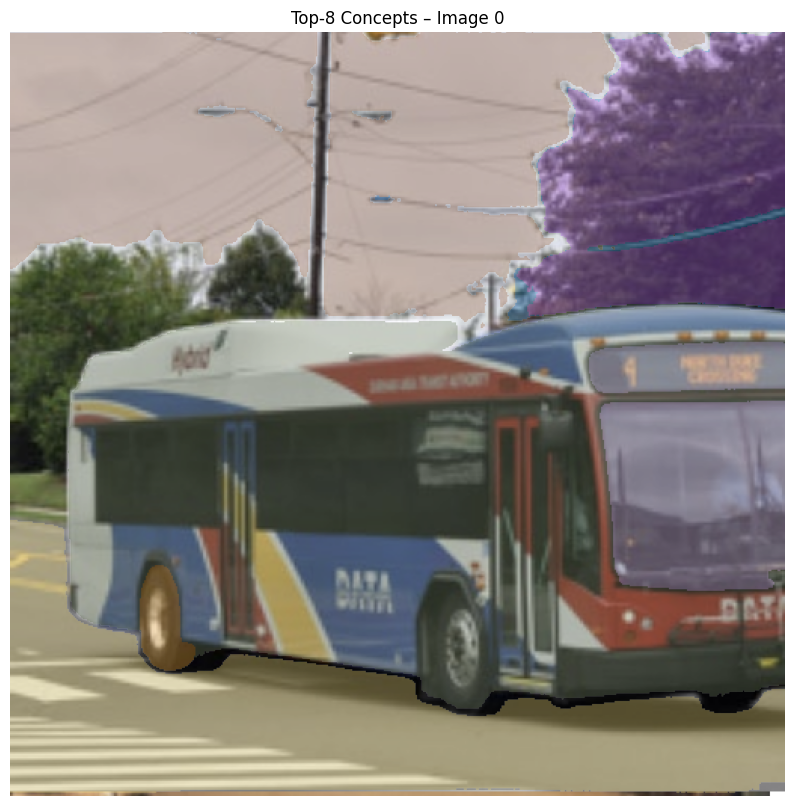

[Image 1] Top-8 concepts : [1, 2, 24, 93, 84, 31, 21, 20]


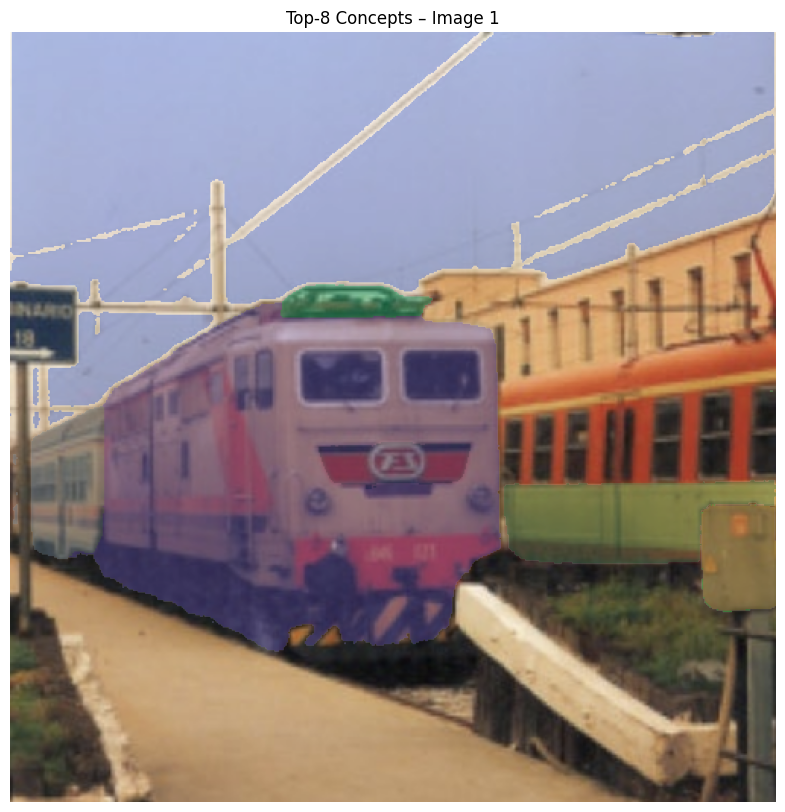

[Image 2] Top-8 concepts : [1, 9, 2, 18, 19, 0, 14, 28]


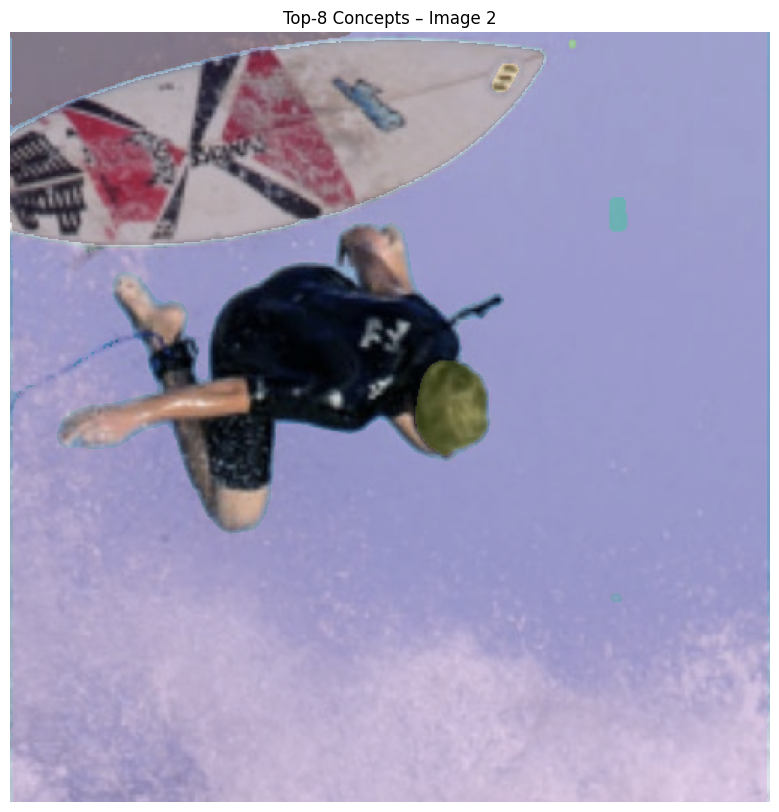

[Image 3] Top-8 concepts : [1, 0, 14, 15, 3, 12, 4, 27]


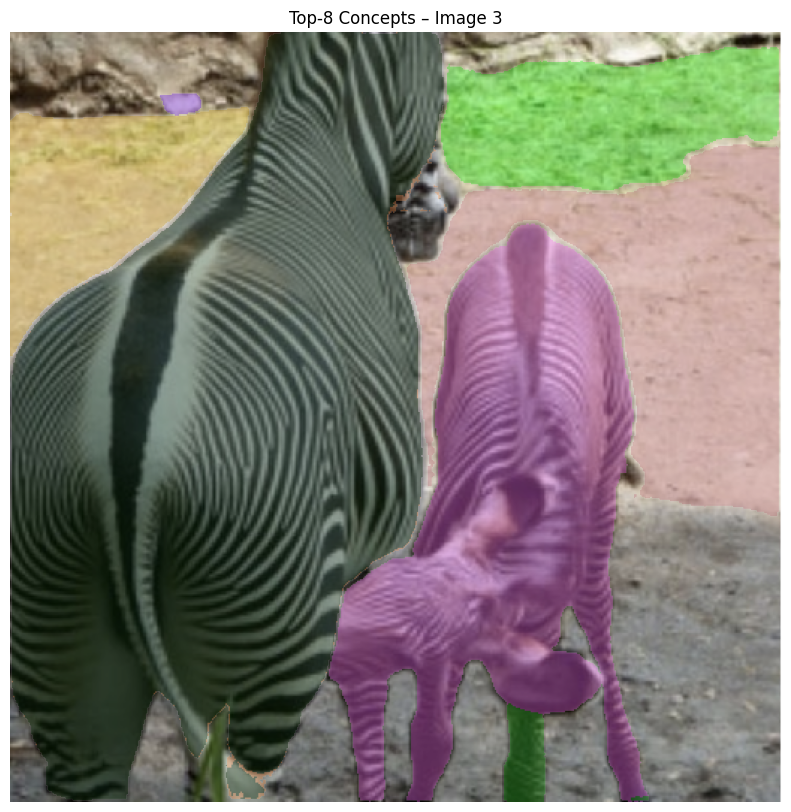

In [22]:
plot_topk_concepts_from_shapley(
    images=images,
    masks=masks,
    all_shapley_values=all_shapley_values,
    top_k=8,
    show_anns_fn=show_anns  # ta fonction d'affichage Segment-Anything
)

In [23]:
def plot_topk_concepts_from_shapley_binary_all(images, masks, all_shapley_values, top_k=8):
    """
    Affiche les top-k concepts (masques binaires fusionnés) pour chaque image selon les valeurs de Shapley.

    Args:
        images (list of np.ndarray): Liste d'images RGB (H x W x 3).
        masks (list of list of dict): Liste de masques par image. Chaque dict doit contenir une clé 'segmentation'.
        all_shapley_values (list of torch.Tensor): Valeurs de Shapley pour chaque image.
        top_k (int): Nombre de concepts à visualiser par image.

    Returns:
        None
    """
    for img_idx, (image, shap_values) in enumerate(zip(images, all_shapley_values)):
        print(f"[Image {img_idx}]")

        # Obtenir les indices des top-k concepts
        _, topk_indices = torch.topk(shap_values, top_k)
        topk_indices = topk_indices.tolist()

        # Extraire les masques binaires correspondants
        masks_subset = [masks[img_idx][i]['segmentation'] for i in topk_indices]

        # Vérifier et fusionner les masques
        masks_subset = [np.array(mask, dtype=bool) for mask in masks_subset]
        combined_mask = np.zeros_like(masks_subset[0], dtype=bool)
        for mask in masks_subset:
            combined_mask |= mask

        # Appliquer le masque à l'image
        masked_image = image.copy()
        masked_image[~combined_mask] = 0  # fond noir

        # Affichage
        plt.figure(figsize=(5, 5))
        plt.imshow(masked_image)
        plt.title(f"Image {img_idx} – Top-{top_k} Concepts")
        plt.axis("off")
        plt.show()


[Image 0]


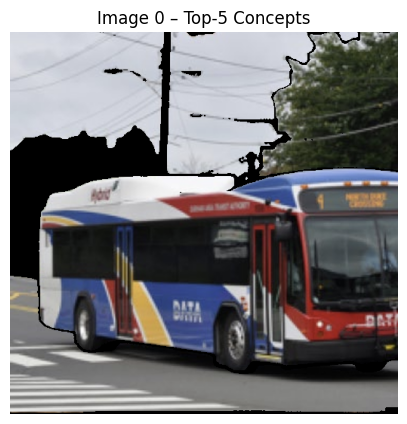

[Image 1]


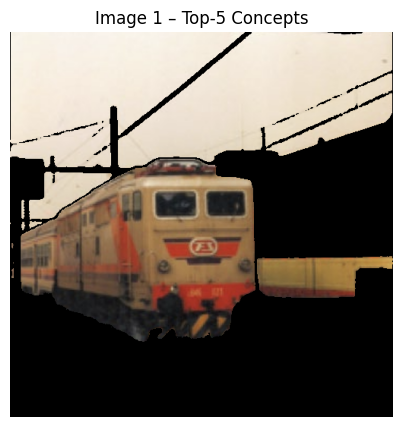

[Image 2]


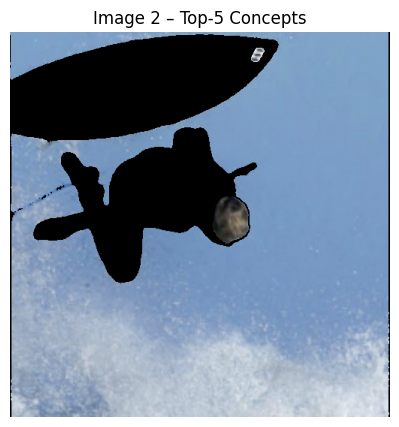

[Image 3]


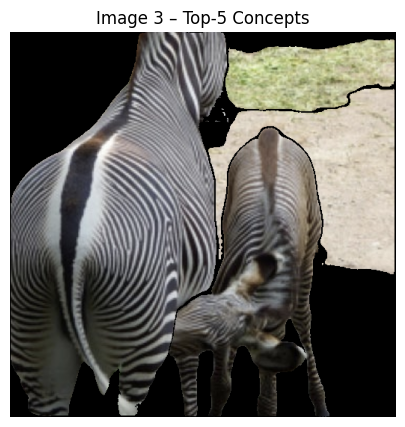

In [32]:
plot_topk_concepts_from_shapley_binary_all(
    images=images,
    masks=masks,
    all_shapley_values=all_shapley_values,
    top_k=8
)

#### **Phase 4 : Évaluation**

Dans cette section, nous évaluons la méthode Explanation by Aggregated Concepts (EAC) selon trois perspectives :  
1. Fidélité de l’EAC pour expliquer les prédictions du modèle  
2. Compréhensibilité des explications EAC du point de vue humain  
3. Efficacité du schéma PIE proposé

#### 4.1 Fidélité de l’EAC

- **Configuration :**  
  Nous évaluons EAC sur quatre images.  
  Le modèle cible est ResNet-50 pré-entraîné sur ces jeux de données.

- **Mesures :**  
  Nous utilisons les protocoles d’insertion et de suppression couramment employés en évaluation XAI. Ceux-ci consistent à insérer ou supprimer progressivement des caractéristiques de concepts de la plus importante à la moins importante, puis à mesurer l’Aire Sous la Courbe (AUC) des probabilités de prédiction.  
  - **Insertion :** commence avec une image entièrement masquée et révèle les concepts progressivement. Une AUC plus élevée signifie une meilleure fidélité.  
  - **Suppression :** commence avec une image non masquée et masque les concepts progressivement. Une AUC plus basse signifie une meilleure fidélité.  
  Nous rapportons la moyenne et l’écart-type sur trois essais.

In [27]:
from sklearn.metrics import auc
import matplotlib.pyplot as plt

def apply_concepts(img, masks, model, normalize, mode='insertion', image_class=None):
    """
    Applique les masques de concepts de manière cumulative (insertion ou suppression).

    Args:
        img (np.ndarray): Image RGB HxWx3.
        masks (list of np.ndarray): Masques binaires HxW, ordonnés par importance.
        model (torch.nn.Module): Modèle cible (ex: ResNet).
        normalize (callable): Fonction de normalisation.
        mode (str): 'insertion' ou 'deletion'.
        image_class (int or None): Classe à évaluer. Si None, utilise la prédiction du modèle.

    Returns:
        list: Liste des probabilités du modèle à chaque étape.
    """
    H, W, C = img.shape
    base = np.zeros_like(img) if mode == 'insertion' else img.copy()
    step_preds = []

    cumulative_masks = []
    current_mask = np.zeros((H, W), dtype=bool)
    for mask in masks:
        current_mask = np.logical_or(current_mask, mask)
        cumulative_masks.append(current_mask.copy())

    for cum_mask in cumulative_masks:
        mask_3d = cum_mask[:, :, None]
        applied = np.where(mask_3d, img, 0) if mode == 'insertion' else np.where(mask_3d, 0, img)

        with torch.no_grad():
            inp = torch.from_numpy(applied).permute(2, 0, 1).float() / 255.
            inp = normalize(inp).unsqueeze(0).to("cuda")
            pred = model(inp)
            if image_class is None:
                image_class = pred.argmax().item()
            proba = torch.softmax(pred, dim=1)[0, image_class].item()

        step_preds.append(proba)

    return step_preds

In [28]:
def compute_auc_curve(step_preds):
    """Calcule l’AUC brute."""
    x = np.linspace(0, 1, len(step_preds))
    return auc(x, step_preds)

In [29]:
def compute_auc_normalized(step_preds, original_proba):
    """AUC normalisée à 1 pour le proba de l'image complète."""
    preds = np.array(step_preds)
    preds[preds >= original_proba] = original_proba
    preds = preds / original_proba
    x = np.linspace(0, 100, len(preds))
    return auc(x, preds)

In [30]:
def evaluate_all_images(images, masks, shapley_values, model, normalize_fn, top_k=10, mode='insertion'):
    """
    Évalue l'AUC pour chaque image avec les top-k concepts selon SHAP.

    Args:
        images (list of np.ndarray): Liste d'images RGB.
        masks (list of list of dict): Masques par image.
        shapley_values (list of Tensor): Valeurs de Shapley par image.
        model (torch.nn.Module): Modèle cible.
        normalize_fn (callable): Fonction de normalisation torchvision.
        top_k (int): Nombre de concepts à utiliser.
        mode (str): 'insertion' ou 'deletion'.

    Returns:
        list of float: AUC (normalisée) pour chaque image.
    """
    aucs = []

    for i, (img, shap, mask_list) in enumerate(zip(images, shapley_values, masks)):
        print(f"Image {i} – Mode: {mode}")

        # Class prédite
        with torch.no_grad():
            inp = torch.from_numpy(img).permute(2, 0, 1).float() / 255.
            inp = normalize_fn(inp).unsqueeze(0).to("cuda")
            pred = model(inp)
            pred_class = pred.argmax().item()
            original_proba = torch.softmax(pred, dim=1)[0, pred_class].item()

        # Top-k masques selon shap
        top_idx = torch.topk(shap, top_k).indices.tolist()
        ordered_masks = [mask_list[j]['segmentation'] for j in top_idx]

        # Insertion ou Deletion
        step_preds = apply_concepts(
            img=img,
            masks=ordered_masks,
            model=model,
            normalize=normalize_fn,
            mode=mode,
            image_class=pred_class
        )

        # AUC
        auc_score = compute_auc_normalized(step_preds, original_proba)
        aucs.append(auc_score)

    return aucs

Image 0 – Mode: insertion
Image 1 – Mode: insertion
Image 2 – Mode: insertion
Image 3 – Mode: insertion
Image 0 – Mode: deletion
Image 1 – Mode: deletion
Image 2 – Mode: deletion
Image 3 – Mode: deletion
Image 0: Insertion AUC = 97.384, Deletion AUC = 7.473
Image 1: Insertion AUC = 40.816, Deletion AUC = 45.025
Image 2: Insertion AUC = 96.773, Deletion AUC = 14.985
Image 3: Insertion AUC = 92.265, Deletion AUC = 16.040


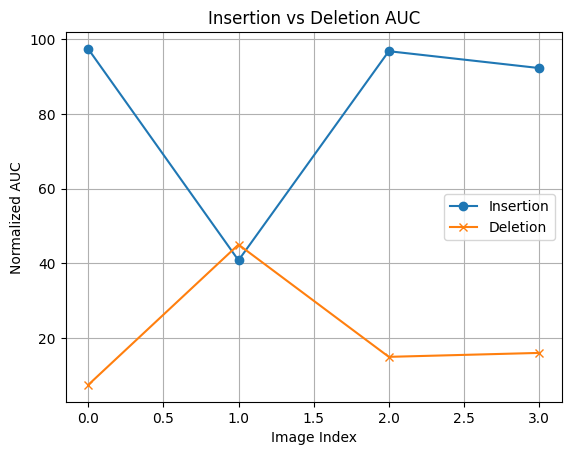

In [31]:
# 👇 AUC pour Insertion
insertion_aucs = evaluate_all_images(
    images=images,
    masks=masks,
    shapley_values=all_shapley_values,
    model=target_model,
    normalize_fn=normalize,
    top_k=10,
    mode="insertion"
)

# 👇 AUC pour Deletion
deletion_aucs = evaluate_all_images(
    images=images,
    masks=masks,
    shapley_values=all_shapley_values,
    model=target_model,
    normalize_fn=normalize,
    top_k=10,
    mode="deletion"
)

for i, (ins, dele) in enumerate(zip(insertion_aucs, deletion_aucs)):
    print(f"Image {i}: Insertion AUC = {ins:.3f}, Deletion AUC = {dele:.3f}")

import matplotlib.pyplot as plt

plt.plot(insertion_aucs, label="Insertion", marker='o')
plt.plot(deletion_aucs, label="Deletion", marker='x')
plt.xlabel("Image Index")
plt.ylabel("Normalized AUC")
plt.title("Insertion vs Deletion AUC")
plt.legend()
plt.grid(True)
plt.show()

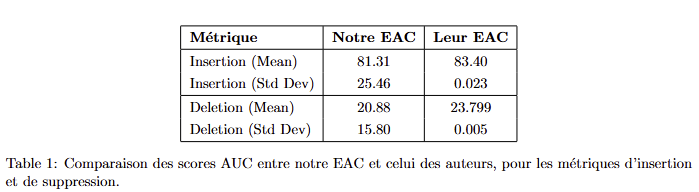

Les résultats montrent que les moyennes obtenues pour les scores d’Insertion (81.31 pour notre EAC vs. 83.40 pour leur EAC) et de Deletion (20.88 vs. 23.80) sont très similaires, ce qui indique une performance globalement comparable entre notre implémentation et celle proposée dans l’article.

Cependant, les écarts-types de notre version (25.46 en Insertion, 15.80 en Deletion) sont nettement plus élevés que ceux du papier (respectivement 0.023 et 0.005), ce qui suggère que leur méthode est plus stable et produit des résultats plus cohérents entre les différentes images.

Cette stabilité accrue peut s’expliquer par le fait que les auteurs ont évalué leur méthode sur un échantillon beaucoup plus large (100 images), tandis que notre évaluation a été réalisée sur seulement 4 images, ce qui rend nos statistiques plus sensibles aux variations individuelles.

#### 4.2 Compréhensibilité de l’EAC

Comme dans l’étude, pour explorer plus en profondeur la compréhensibilité des sorties des différentes méthodes XAI, nous avons mené une évaluation humaine afin de vérifier si EAC produit des explications plus compréhensibles pour les humains que les méthodes de référence.

Nous avons montré les huit explications générées sur les 4 images par EAC ainsi que celles produites par d’autres modèles (images extraites du papier).  
On a demandé aux participants de choisir, pour chaque image, l’explication qu’ils jugeaient la plus compréhensible.


**Participants :**  
- Six participants au total, tous étudiants dans des domaines pertinents.  

**Résultats :**  
- Parmi ces 4 images, EAC a toujours été préféré.
- Aucun des autres baselines ne s’est démarqué significativement.  

Évidemment, il faudrait idéalement tester les participants sur plusieurs images, mais cela montre des résultats encourageants.  
Ces résultats confirment que EAC produit des explications plus compréhensibles que les autres méthodes.

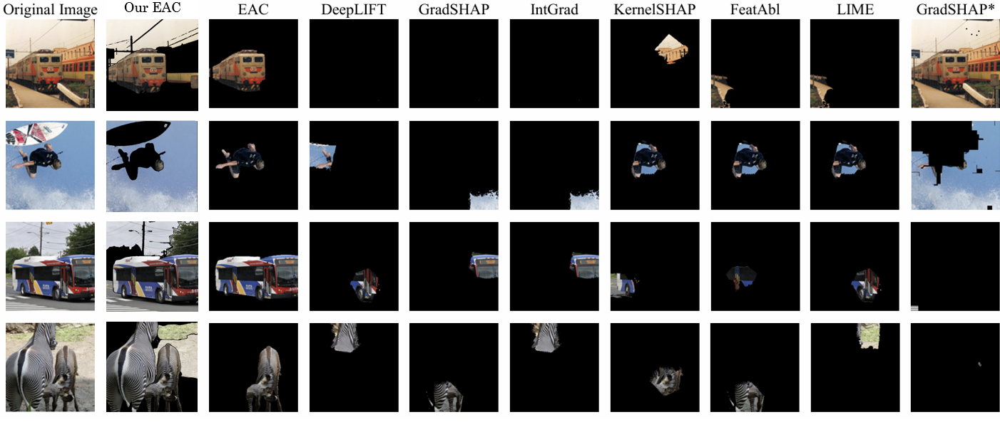

#### 4.3 Étude d’ablation du schéma PIE

Nous avons évalué l’efficacité de notre implémentation du schéma PIE en comparant les valeurs obtenues avec celles rapportées dans l’article, face à trois approches alternatives pour le calcul des valeurs de Shapley.

En termes de temps de calcul, notre implémentation met en moyenne environ 10 minutes par image, contre 245 secondes (environ 4 minutes) pour leur version de l’EAC. Cette différence peut s'expliquer par des ressources matérielles différentes ou des optimisations spécifiques dans leur pipeline.

Cela dit, notre méthode reste nettement plus efficace que le calcul direct des valeurs de Shapley à partir du modèle cible (ResNet-50), qui, selon le papier, prend plus de 24 heures par image. Cela souligne l’intérêt pratique d’un modèle substitut tel que le schéma PIE pour rendre l’explication par concepts applicable à grande échelle.

